# Рынок заведений общественного питания Москвы

## Введение:

Цель данного исследования — проанализировать рынок заведений общественного питания Москвы с целью предоставления инвесторам фонда «Shut Up and Take My Money» рекомендаций по открытию нового заведения. Исследование охватывает ключевые аспекты ресторанного бизнеса в столице, начиная от количества заведений в различных категориях, таких как кафе, рестораны, пиццерии и кофейни, до анализа факторов, влияющих на успех и популярность этих заведений.

В ходе исследования будут рассмотрены следующие вопросы: распределение заведений по категориям и административным округам, анализ сетевых и несетевых заведений, исследование рейтингов и средних цен по районам, а также определение категорий заведений, которые чаще всего являются сетевыми.

Особое внимание будет уделено анализу кофеен, включая их количество, расположение, рейтинг, а также стоимость чашки капучино. Этот анализ поможет инвесторам оценить перспективы открытия новой кофейни и принять обоснованное решение, основанное на данных о текущем рынке.

Исследование предполагает использование методов визуализации данных и статистического анализа для выявления ключевых закономерностей и тенденций в ресторанной индустрии Москвы.

## План работы:

1. **Загрузка и изучение данных**:
   - В этой части проекта будут загружены данные о заведениях общественного питания Москвы. Далее будет проведен первичный анализ данных, чтобы получить общее представление о содержимом: сколько заведений представлено в датасете, какие категории данных содержатся в каждом столбце, и какие типы данных они представляют.

2. **Предобработка данных**:
   - На этом этапе будет проведена очистка данных. Необходимо удалить дубликаты и обработать пропуски. Также будут созданы новые столбцы, такие как "улица" (street) и "круглосуточные заведения" (is_24_7), чтобы улучшить анализ данных.

3. **Анализ данных**:
   - Будет проведен детальный анализ категорий заведений, исследовано количество посадочных мест, соотношение сетевых и несетевых заведений. Также будут выделены наиболее популярные сети общественного питания в Москве, а данные по количеству заведений будут сгруппированы по административным районам. Визуализация данных поможет лучше понять распределение рейтингов заведений по категориям и районам.

4. **Исследование для открытия кофейни**:
   - В этой части будет рассмотрен рынок кофеен в Москве. В частности, будет изучено количество кофеен, их расположение по районам и наличие круглосуточных заведений. Также будут проанализированы рейтинги кофеен и стоимость чашки капучино. На основе этих данных будут даны рекомендации по открытию новой кофейни для инвесторов фонда "Shut Up and Take My Money".

## Описание столбцов данных:

- **name** — название заведения;
- **address** — адрес заведения;
- **category** — категория заведения (например, кафе, ресторан, пиццерия);
- **hours** — время работы заведения;
- **lat** — широта местоположения;
- **lng** — долгота местоположения;
- **rating** — рейтинг заведения по оценкам пользователей (макс. 5.0);
- **price** — ценовая категория (средняя, выше или ниже среднего);
- **avg_bill** — средняя стоимость заказа (в рублях);
- **middle_avg_bill** — числовое значение среднего чека;
- **middle_coffee_cup** — стоимость чашки капучино;
- **chain** — сетевое заведение (0 — нет, 1 — да);
- **district** — административный округ Москвы;
- **seats** — количество посадочных мест.

# Шаг 1. Загрузка данных и изучение общей информации

In [1]:
# Импортируем необходимые библиотеки для анализа данных и визуализации

import pandas as pd  # Работа с данными в табличном формате
import matplotlib.pyplot as plt  # Построение графиков и визуализация данных
import seaborn as sns  # Визуализация данных с улучшенным стилем и функциями
import os  # Работа с операционной системой, проверка путей к файлам
import json  # Работа с JSON-данными, например, для загрузки географических данных
import folium  # Создание интерактивных карт
from folium import Map, Choropleth  # Импорт базовых функций для создания карт и хороплетов
from folium import Map, Marker  # Импорт карты и маркеров для отображения точек на карте
from folium.plugins import MarkerCluster  # Плагин для создания кластеров маркеров на карте

# Задаем пути к файлам на локальной машине и сервере
local_path = '/Users/aleksejpanov/Desktop/проекты по Яндекс Практикум /сборный проект/moscow_places.csv'
server_path = '/datasets/moscow_places.csv'

# Проверяем наличие файла на локальной машине или сервере
if os.path.exists(local_path):
    data = pd.read_csv(local_path)
    print("Файл загружен с локальной машины.")
elif os.path.exists(server_path):
    data = pd.read_csv(server_path)
    print("Файл загружен с сервера.")
else:
    data = None
    print('Файл не найден ни на локальной машине, ни на сервере.')

if data is not None:
    display(data.head())
else:
    print("Не удалось загрузить данные, так как файл не найден.")


Файл загружен с сервера.


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [2]:
# Отображаем общую информацию о датасете
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
# Преобразуем столбец 'chain' в булев тип данных для более точного отражения его смысла
data['chain'] = data['chain'].astype('bool')

# Преобразуем столбец 'seats' в целочисленный тип данных 'Int64', который поддерживает пропущенные значения
data['seats'] = data['seats'].astype('Int64')


## Общий вывод:

Мы загрузили данные о **8 406 заведениях** общественного питания Москвы и изучили их общую информацию. В датасете представлено **14 столбцов** с различными типами данных.

**Корректность типов данных:**

- **Столбцы с корректными типами данных:**

  - `name`, `category`, `address`, `district`, `hours` имеют тип данных `object`, что соответствует их текстовому содержимому.
    
  - `lat`, `lng`, `rating`, `middle_avg_bill`, `middle_coffee_cup` имеют тип данных `float64`, что подходит для числовых данных с плавающей точкой.

- **Столбцы с некорректными типами данных:**

  
  - **`chain`** имеет тип `int64`, но содержит бинарные значения (1 и 0). Рекомендуется преобразовать этот столбец в булевый тип данных `bool` для более точного отражения его сути.

  - **`seats`** имеет тип `float64`, хотя количество мест должно быть целым числом. Рекомендуется преобразовать этот столбец в целочисленный тип данных `int64`.

Для корректного выполнения математических операций и дальнейшего анализа данных необходимо привести столбцы с некорректными типами данных к соответствующим типам. Это обеспечит точность расчетов и облегчит работу с данными в последующих шагах.


# Шаг 2. Предобработка данных


## 2.1 Изучение пропусков в DataFrame

In [4]:
# Столбец 'hours'
hours_omissions = (data['hours'].isna().sum() / len(data['hours'])) * 100
print(f"Процент пропущенных значений в столбце 'hours': {hours_omissions:.2f}%")

# Столбец 'price'
price_omissions = (data['price'].isna().sum() / len(data['price'])) * 100
print(f"Процент пропущенных значений в столбце 'price': {price_omissions:.2f}%")

# Столбец 'avg_bill'
avg_bill_omissions = (data['avg_bill'].isna().sum() / len(data['avg_bill'])) * 100
print(f"Процент пропущенных значений в столбце 'avg_bill': {avg_bill_omissions:.2f}%")

# Столбец 'middle_avg_bill'
middle_avg_bill_omissions = (data['middle_avg_bill'].isna().sum() / len(data['middle_avg_bill'])) * 100
print(f"Процент пропущенных значений в столбце 'middle_avg_bill': {middle_avg_bill_omissions:.2f}%")

# Столбец 'middle_coffee_cup'
middle_coffee_cup_omissions = (data['middle_coffee_cup'].isna().sum() / len(data['middle_coffee_cup'])) * 100
print(f"Процент пропущенных значений в столбце 'middle_coffee_cup': {middle_coffee_cup_omissions:.2f}%")

# Столбец 'seats'
seats_omissions = (data['seats'].isna().sum() / len(data['seats'])) * 100
print(f"Процент пропущенных значений в столбце 'seats': {seats_omissions:.2f}%")




Процент пропущенных значений в столбце 'hours': 6.38%
Процент пропущенных значений в столбце 'price': 60.56%
Процент пропущенных значений в столбце 'avg_bill': 54.60%
Процент пропущенных значений в столбце 'middle_avg_bill': 62.54%
Процент пропущенных значений в столбце 'middle_coffee_cup': 93.64%
Процент пропущенных значений в столбце 'seats': 42.96%


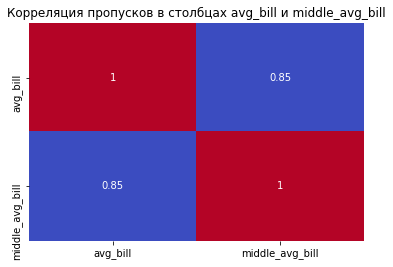

In [5]:
# Создаем матрицу пропусков для столбцов 'avg_bill' и 'middle_avg_bill'
missing_matrix = data[['avg_bill', 'middle_avg_bill']].isna()

# Вычисляем корреляционную матрицу пропусков
correlation_matrix = missing_matrix.corr()

# Визуализируем корреляцию пропусков с помощью тепловой карты
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', cbar=False)
plt.title('Корреляция пропусков в столбцах avg_bill и middle_avg_bill')
plt.show()

### Промежуточный вывод:

В ходе анализа данных выявлены пропущенные значения в нескольких столбцах. Особое внимание стоит обратить на столбцы с высоким процентом пропусков, такие как `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`.

- **Столбцы с высоким процентом пропусков:**

  - Из-за большого количества пропусков и высокой корреляции между ними нет возможности заполнить отсутствующие значения на основе других столбцов. Заполнение средними значениями или модой может сильно исказить данные и привести к неверным выводам.
  - Удаление строк с пропусками также не является оптимальным решением, так как значительно уменьшит объем данных, что негативно повлияет на репрезентативность выборки и конечные результаты анализа.
  - **Решение:** Оставить пропуски в этих столбцах без изменений или, при необходимости, исключить данные столбцы из анализа, если они не являются критически важными для исследования.


- **Столбцы с низким процентом пропусков:**

  - Несмотря на низкий процент пропусков в столбце `hours`, отсутствует возможность корректно заполнить эти значения на основе других данных.
  - **Решение:** Пропуски в столбце `hours` оставить без изменений, так как их наличие не окажет существенного влияния на результаты анализа.


**Заключение**
- Принято решение не заполнять пропущенные значения в указанных столбцах, чтобы избежать искажения данных и сохранения репрезентативности выборки.
- В дальнейшем анализе необходимо учитывать наличие пропусков и использовать методы, способные работать с неполными данными или минимизировать их влияние на результаты исследования.


## 2.2 Анализ дубликатов в DataFrame


In [6]:
print(f"Количество дублированных строк: {data.duplicated().sum()}")

Количество дублированных строк: 0


In [7]:
# Выводим количество уникальных значений в столбце 'name' до коррекции
print(f'Количество уникальных значений до коррекции: {len(data["name"].unique())}')

# Преобразуем значения в столбце 'name' для унификации
data['name'] = data['name'].str.strip()          # Удаляем пробелы в начале и конце
data['name'] = data['name'].str.lower()          # Приводим к нижнему регистру
data['name'] = data['name'].str.replace('ё', 'е') # Заменяем 'ё' на 'е'
data['name'] = data['name'].str.replace('"', '')  # Удаляем двойные кавычки

# Выводим количество уникальных значений в столбце 'name' после коррекции
print(f'Количество уникальных значений после коррекции: {len(data["name"].unique())}')

Количество уникальных значений до коррекции: 5614
Количество уникальных значений после коррекции: 5506


In [8]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [9]:
# Выводим количество уникальных значений в столбце 'address' до коррекции
print(f'Количество уникальных значений до коррекции: {len(data["address"].unique())}')

# Преобразуем значения в столбце 'address' для унификации
data['address'] = data['address'].str.strip()             # Удаляем пробелы в начале и конце
data['address'] = data['address'].str.lower()             # Приводим к нижнему регистру
data['address'] = data['address'].str.replace('ё', 'е')   # Заменяем 'ё' на 'е'
data['address'] = data['address'].str.replace('"', '')    # Удаляем двойные кавычки

# Выводим количество уникальных значений в столбце 'address' после коррекции
print(f'Количество уникальных значений после коррекции: {len(data["address"].unique())}')


Количество уникальных значений до коррекции: 5753
Количество уникальных значений после коррекции: 5752


In [10]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [11]:
# Выводим количество уникальных значений в столбце 'hours' до коррекции
print(f'Количество уникальных значений до коррекции: {len(data["hours"].unique())}')

# Преобразуем значения в столбце 'hours' для унификации
data['hours'] = data['hours'].str.strip()               # Удаляем пробелы в начале и конце
data['hours'] = data['hours'].str.lower()               # Приводим к нижнему регистру
data['hours'] = data['hours'].str.replace('ё', 'е')     # Заменяем 'ё' на 'е'
data['hours'] = data['hours'].str.replace('"', '')      # Удаляем двойные кавычки

# Выводим количество уникальных значений в столбце 'hours' после коррекции
print(f'Количество уникальных значений после коррекции: {len(data["hours"].unique())}')


Количество уникальных значений до коррекции: 1308
Количество уникальных значений после коррекции: 1308


In [12]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [13]:
# Выводим количество уникальных значений в столбце 'avg_bill' до коррекции
print(f'Количество уникальных значений до коррекции: {len(data["avg_bill"].unique())}')

# Преобразуем значения в столбце 'avg_bill' для унификации
data['avg_bill'] = data['avg_bill'].str.strip()                # Удаляем пробелы в начале и конце
data['avg_bill'] = data['avg_bill'].str.lower()                # Приводим к нижнему регистру
data['avg_bill'] = data['avg_bill'].str.replace('ё', 'е')      # Заменяем 'ё' на 'е'
data['avg_bill'] = data['avg_bill'].str.replace('"', '')       # Удаляем двойные кавычки

# Выводим количество уникальных значений в столбце 'avg_bill' после коррекции
print(f'Количество уникальных значений после коррекции: {len(data["avg_bill"].unique())}')

Количество уникальных значений до коррекции: 898
Количество уникальных значений после коррекции: 898


In [14]:
# Проверяем наличие дубликатов по столбцам 'name' и 'address'
duplicates = data[data.duplicated(subset=['name', 'address'], keep=False)]

# Выводим количество дубликатов до удаления
print(f"Количество дубликатов до удаления: {len(duplicates)}")

# Удаляем дубликаты и обновляем исходный DataFrame
data.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)

# Проверяем количество дубликатов после удаления
duplicates_after = data[data.duplicated(subset=['name', 'address'], keep=False)]
print(f"Количество дубликатов после удаления: {len(duplicates_after)}")


Количество дубликатов до удаления: 8
Количество дубликатов после удаления: 0


### Промежуточный вывод:

- В датасете **отсутствуют дублированные строки**, что подтверждает уникальность каждой записи после проверки на скрытые (неявные) дубликаты.

- Проведена унификация данных в столбцах `name`, `address`, `district` и `hours`:
  - **Устранены лишние пробелы** и приведены значения к **нижнему регистру**.
  - **Заменены символы** `'ё'` на `'е'` и **удалены двойные кавычки**.

## 2.3 Добавление новых атрибутов в DataFrame


In [15]:
# Извлекаем улицу из столбца 'address', разделяя строки по запятой и удаляя пробелы
data['street'] = data['address'].str.split(',').str[1].str.strip()

In [16]:
# Создаем столбец 'is_24_7', присваивая True, если заведение работает круглосуточно и ежедневно, иначе False
data['is_24_7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)

In [17]:
# Выводим первые три строки DataFrame для проверки созданных столбцов 'street' и 'is_24_7'
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,<NA>,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счет:1500–1600 ₽,1550.0,NaN,False,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счет:от 1000 ₽,1000.0,NaN,False,45,клязьминская улица,False


## Общий вывод: 
В ходе предобработки данных были выявлены пропуски в столбцах, таких как `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`. Принято решение не заполнять пропуски в этих столбцах, чтобы избежать искажения данных. Пропуски в столбце `hours` также оставлены без изменений, так как их влияние на анализ минимально. Дубликаты в данных не обнаружены, проведена унификация значений в столбцах `name`, `address`, `district` и `hours`. Кроме того, добавлены два новых столбца: `street`, который содержит названия улиц, и `is_24_7`, обозначающий, работают ли заведения круглосуточно. Эти шаги обеспечили корректную подготовку данных для дальнейшего анализа.

# Шаг 3. Анализ данных

## 3.1 Анализ распределения объектов общественного питания по категориям

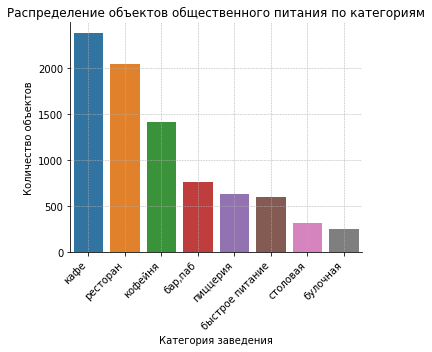

In [18]:
# Упорядочиваем категории по количеству объектов, сортируя их в порядке убывания
order = data['category'].value_counts().index

# Строим столбчатую диаграмму, отображающую количество объектов по категориям, используя сортированные категории
sns.catplot(data=data, x="category", kind="count", order=order)

# Поворачиваем метки оси X на 45 градусов для лучшей читаемости и выравниваем их по правому краю
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок для графика
plt.title("Распределение объектов общественного питания по категориям")

# Подписываем оси графика
plt.xlabel("Категория заведения")
plt.ylabel("Количество объектов")

# Добавляем сетку для улучшения восприятия графика
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()

plt.savefig('Распределение объектов общественного питания по категориям', dpi=300)

# Отображаем график
plt.show()

### Промежуточный вывод:

В данных представлены различные категории заведений общественного питания, включая кафе, рестораны, кофейни, бары и пиццерии. Наибольшее количество объектов приходится на кафе (2378 заведений), за ними следуют рестораны (2043 заведения) и кофейни (1413 заведений). Менее всего в датасете представлено булочных (256 объектов). Это свидетельствует о том, что кафе и рестораны являются самыми распространенными типами заведений, тогда как другие категории, такие как бары, пиццерии и столовые, представлены в меньшем количестве.


## 3.2 Анализ количества посадочных мест в заведениях по категориям

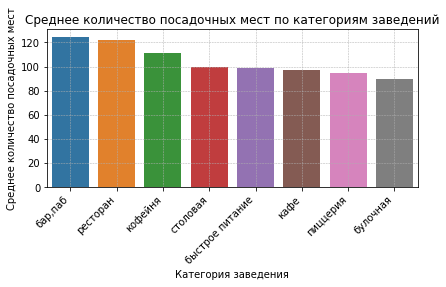

In [19]:
# Вычисляем среднее количество посадочных мест для каждой категории и сбрасываем индекс для удобства работы с DataFrame
category_seats_mean = data.groupby('category')['seats'].mean().reset_index()

# Упорядочиваем категории по среднему количеству посадочных мест в порядке убывания
order = category_seats_mean.sort_values(by="seats", ascending=False)['category']

# Строим столбчатую диаграмму, используя упорядоченные категории
sns.barplot(x="category", y="seats", data=category_seats_mean, order=order)

# Поворачиваем метки оси X на 45 градусов для предотвращения наложения текста
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок для графика
plt.title('Среднее количество посадочных мест по категориям заведений')

# Подписываем оси графика
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество посадочных мест')

# Добавляем сетку для улучшения визуального восприятия
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()

plt.savefig('Среднее количество посадочных мест по категориям заведений', dpi=300)

# Отображаем график
plt.show()

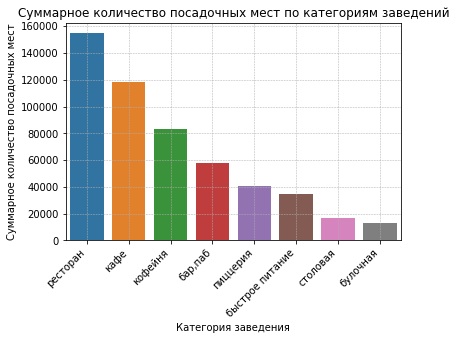

In [20]:
# Вычисляем суммарное количество посадочных мест для каждой категории и сбрасываем индекс для удобства работы с DataFrame
category_seats_sum = data.groupby('category')['seats'].sum().reset_index()

# Упорядочиваем категории по суммарному количеству посадочных мест в порядке убывания
order = category_seats_sum.sort_values(by="seats", ascending=False)['category']

# Строим столбчатую диаграмму, используя упорядоченные категории
sns.barplot(x="category", y="seats", data=category_seats_sum, order=order)

# Поворачиваем метки оси X на 45 градусов для предотвращения наложения текста
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок для графика
plt.title('Суммарное количество посадочных мест по категориям заведений')

# Подписываем оси графика
plt.xlabel('Категория заведения')
plt.ylabel('Суммарное количество посадочных мест')

# Добавляем сетку для улучшения визуального восприятия
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.show()

### Промежуточный вывод:

Анализ количества посадочных мест в различных категориях заведений показал следующие результаты.

1. **Среднее количество посадочных мест**:
   - Наибольшее среднее количество мест наблюдается в категории "бар, паб" (124 места) и "ресторан" (122 места), что указывает на то, что эти типы заведений ориентированы на более крупные группы посетителей.
   - В меньших заведениях, таких как "булочные" и "пиццерии", среднее количество посадочных мест меньше — около 89 и 94 мест соответственно, что объясняется более ограниченными пространствами.

2. **Суммарное количество посадочных мест**:
   - Категория "ресторан" имеет наибольшее суммарное количество посадочных мест (154,869), за ней следуют "кафе" (118,770) и "кофейни" (83,511). Это говорит о том, что рестораны и кафе доминируют на рынке по общей вместимости.
   - Меньше всего мест в категориях "булочная" (13,229) и "столовая" (16,359), что также отражает их меньшую представленность и масштабы по сравнению с ресторанами и кафе.

**Заключение:**
Рестораны и кафе имеют наибольшую как среднюю, так и суммарную вместимость, что свидетельствует об их популярности и ориентации на большие группы посетителей. В то время как такие заведения, как булочные и пиццерии, имеют меньшую вместимость, что соответствует их более узкому профилю обслуживания.


## 3.3 Соотношение сетевых и несетевых заведений:

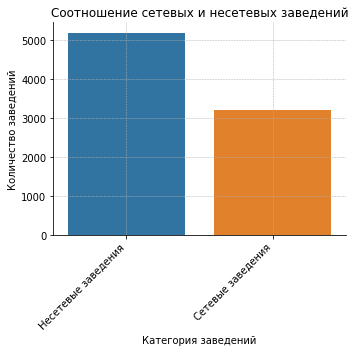

In [21]:
# Переименовываем значения True и False на "Сетевые заведения" и "Несетевые заведения"
data['chain_name'] = data['chain'].replace({True: 'Сетевые заведения', False: 'Несетевые заведения'})

# Строим столбчатую диаграмму, отображающую количество сетевых и несетевых заведений
sns.catplot(data=data, x="chain_name", kind="count")

# Поворачиваем метки оси X на 45 градусов для лучшей читаемости и выравниваем их по правому краю
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок для графика
plt.title("Соотношение сетевых и несетевых заведений")

# Подписываем оси графика
plt.xlabel("Категория заведений")
plt.ylabel("Количество заведений")

# Добавляем сетку для улучшения восприятия графика
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()

plt.savefig('Соотношение сетевых и несетевых заведений', dpi=300)

# Отображаем график
plt.show()

### Промежуточный вывод:

Анализ соотношения сетевых и несетевых заведений показал, что в датасете преобладают несетевые заведения. Их количество составляет 5201, в то время как сетевых заведений меньше — 3205. Таким образом, несетевые заведения составляют большую часть объектов общественного питания, что может свидетельствовать о разнообразии и популярности независимых заведений на рынке, в то время как сетевые заведения, хотя и представлены в меньшем количестве, также занимают значительную долю.


## 3.4 Анализ категорий заведений с преобладанием сетевых объектов

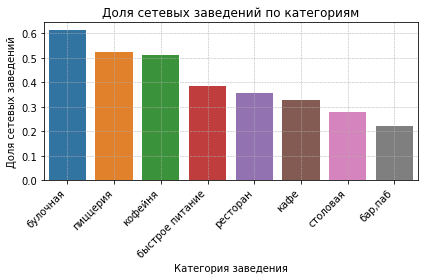

In [22]:
# Вычисляем долю сетевых заведений для каждой категории
category_chain = data.groupby('category')['chain'].mean().reset_index()

# Упорядочиваем категории по доле сетевых заведений
order = category_chain.sort_values(by="chain", ascending=False)['category']

# Строим столбчатую диаграмму, используя упорядоченные категории
sns.barplot(x="category", y="chain", data=category_chain, order=order)

# Поворачиваем метки оси X на 45 градусов для предотвращения наложения текста
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок для графика
plt.title('Доля сетевых заведений по категориям')

# Подписываем оси графика
plt.xlabel('Категория заведения')
plt.ylabel('Доля сетевых заведений')

# Добавляем сетку для улучшения визуального восприятия
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.savefig('Доля сетевых заведений по категориям.png', dpi=300)

# Отображаем график
plt.show()


### Промежуточный вывод:

Анализ данных показал, что категории заведений, которые чаще всего являются сетевыми, включают булочные (61.3% сетевых заведений), пиццерии (52.1%) и кофейни (50.9%). Эти категории показывают высокую долю сетевых заведений, что может быть связано с тенденцией к стандартизации и массовому распространению таких форматов заведений. В то же время, бары и пабы (22.1%), столовые (27.9%) и кафе (32.8%) реже оказываются сетевыми, что может указывать на их большую независимость или привязанность к отдельным владельцам, а не к крупным сетям.

Таким образом, категории, которые чаще являются сетевыми, включают булочные, пиццерии и кофейни, что отражает их популярность в виде сетевых форматов.


## 3.5 Анализ топ-15 популярных сетей общественного питания в Москве

In [23]:
# Фильтруем только сетевые заведения
chain_data = data[data['chain']]

# Находим топ-15 популярных сетей по количеству заведений
name_max = chain_data['name'].value_counts().head(15).index

# Фильтруем данные для этих топ-15 сетей
top_15_name = chain_data.query('name in @name_max')

# Группируем данные и считаем количество объектов для каждой сети
top_15_grouped = top_15_name.groupby('name')['name'].count().reset_index(name='count')

# Сортируем топ-15 сетей по количеству заведений от большего к меньшему
top_15_grouped_sorted = top_15_grouped.sort_values(by='count', ascending=False)

# Выводим отсортированные данные
top_15_grouped_sorted

,name,count
13,шоколадница,120
6,домино'с пицца,76
5,додо пицца,74
2,one price coffee,71
14,яндекс лавка,69
1,cofix,65
3,prime,50
11,хинкальная,44
7,кофепорт,42
8,кулинарная лавка братьев караваевых,39


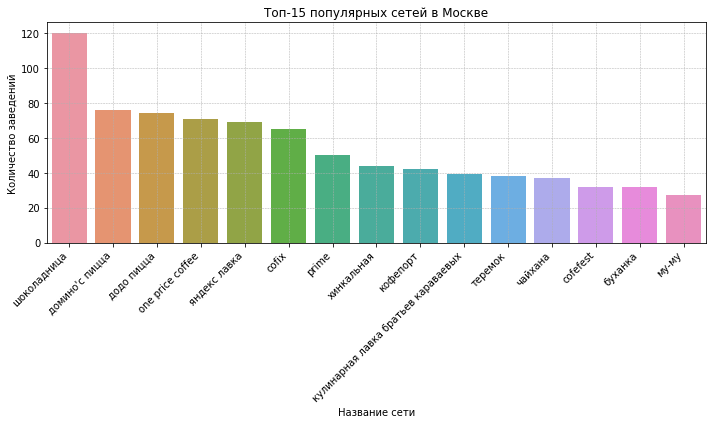

In [24]:
# Увеличиваем размер графика
plt.figure(figsize=(10, 6))

# Строим столбчатую диаграмму
sns.barplot(x='name', y='count', data=top_15_grouped_sorted)

# Поворачиваем метки на оси X для лучшей читабельности
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок
plt.title('Топ-15 популярных сетей в Москве')

# Подписываем оси
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')

# Добавляем сетку для удобства чтения
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.savefig('Топ-15 популярных сетей в Москве', dpi=300)

# Отображаем график
plt.show()

In [25]:
# Фильтруем только сетевые заведения
chain_data = data[data['chain']]

# Находим топ-15 популярных сетей по количеству заведений
name_max = chain_data['name'].value_counts().head(15).index

# Фильтруем данные для этих топ-15 сетей
top_15_name = chain_data.query('name in @name_max')

# Группируем данные по имени и категории и считаем количество объектов для каждой комбинации
top_15_grouped = top_15_name.groupby(['name', 'category']).size().reset_index(name='count')

# Сортируем топ-15 сетей по количеству заведений от большего к меньшему
top_15_grouped_sorted = top_15_grouped.sort_values(by='count', ascending=False)

# Выводим отсортированные данные с указанием категории
top_15_grouped_sorted


,name,category,count
31,шоколадница,кофейня,119
10,домино'с пицца,пиццерия,76
9,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
32,яндекс лавка,ресторан,69
2,cofix,кофейня,65
5,prime,ресторан,49
11,кофепорт,кофейня,42
12,кулинарная лавка братьев караваевых,кафе,39
21,теремок,ресторан,36


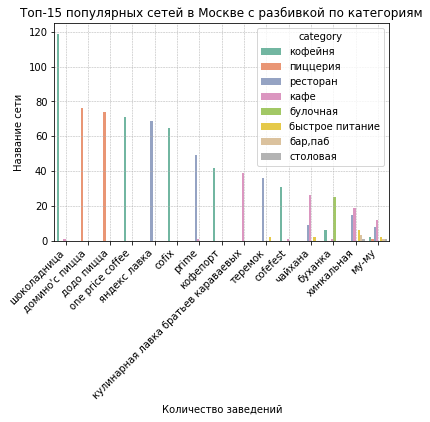

In [26]:
# Строим столбчатую диаграмму с разделением по категориям
sns.barplot(x='name', y='count', hue='category', data=top_15_grouped_sorted, palette='Set2')

# Поворачиваем метки на оси X для лучшей читабельности (если нужно)
plt.xticks(rotation=45, ha='right')

# Добавляем заголовок и подписи осей
plt.title('Топ-15 популярных сетей в Москве с разбивкой по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.show()

### Промежуточный вывод:

В результате анализа данных были выявлены топ-15 популярных сетевых заведений Москвы по количеству объектов. Лидером среди сетей является "Шоколадница", которая имеет наибольшее количество заведений (120). Далее следуют такие сети, как "Домино'с пицца" (76 заведений), "Додо пицца" (74 заведения) и "One Price Coffee" (71 заведение).

Большинство популярных сетей относятся к категории кофейня (например, "Шоколадница", "Cofix", "Кофепорт"), а также встречаются сети в категориях пиццерия (например, "Домино'с пицца", "Додо пицца") и ресторан (например, "Яндекс Лавка", "Prime"). Некоторые сети, такие как "Хинкальная" и "Му-Му", представлены сразу в нескольких категориях. Это может быть связано либо с ошибкой в базе данных, либо с тем, что заведения функционируют в гибридных форматах, предлагая услуги, которые подходят для разных категорий.

Признаком, который объединяет большинство сетей, является их широкая представленность в категориях общественного питания, таких как кофейни, рестораны и пиццерии. Эти сети известны своей доступностью и популярностью среди различных слоев населения, что делает их важной частью ресторанного рынка Москвы. Таким образом, данные показывают, что кофейни и пиццерии составляют значительную часть популярных сетей в Москве, что может свидетельствовать о высокой востребованности данных типов заведений в городском пространстве.


## 3.6 Анализ распределения заведений по административным районам Москвы и категориям

In [27]:
# Создаем словарь, который содержит сокращения для административных округов Москвы
district_short = {
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ': 'СВАО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Центральный административный округ': 'ЦАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Западный административный округ': 'ЮЗАО'
}

# Применяем сокращения округов к столбцу 'district' и создаем новый столбец 'district_abbreviation' 
data['district_abbreviation'] = data['district'].replace(district_short)

# Получаем список уникальных административных округов с сокращениями
district = data['district_abbreviation'].unique()

# Подсчитываем общее количество заведений в каждом округе и сортируем по убыванию
district_count = (data.groupby('district_abbreviation')
                  .size()
                  .reset_index(name='total_count')
                  .sort_values(by='total_count', ascending=False))

# Подсчитываем количество заведений каждой категории в каждом округе и сортируем по убыванию
district_category = (data.groupby(['district_abbreviation', 'category'])
                     .size()
                     .reset_index(name='count')
                     .sort_values(by='count', ascending=False))


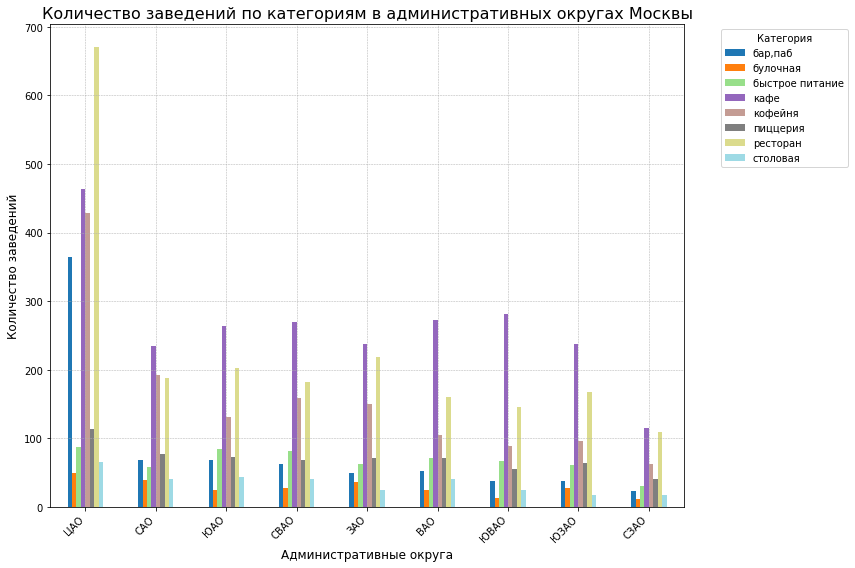

In [28]:
# Создаем сводную таблицу, где строки — районы, а столбцы — категории, сортируем по количеству заведений
pivot_data = district_category.pivot(index='district_abbreviation', columns='category', values='count').fillna(0)

# Сортируем сводную таблицу по общему количеству заведений в каждом округе
pivot_data = pivot_data.loc[district_count['district_abbreviation']]

# Строим столбчатую диаграмму
pivot_data.plot(kind='bar', figsize=(12, 8), colormap='tab20')

# Добавляем заголовок и подписи осей
plt.title('Количество заведений по категориям в административных округах Москвы', fontsize=16)
plt.xlabel('Административные округа', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем легенду для категорий заведений
plt.legend(title='Категория', bbox_to_anchor=(1.05, 1), loc='upper left')

# Добавляем сетку для улучшения восприятия
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Сохраняем график в файл
plt.tight_layout()
plt.savefig('Количество заведений по категориям в административных округах Москвы.png', dpi=300)

# Отображаем график
plt.show()


### Промежуточный вывод:

В результате анализа данных были выявлены административные округа Москвы, в которых находятся заведения общественного питания. Лидером по общему количеству заведений является **Центральный административный округ (ЦАО)**, где расположено 2242 заведения. Следом идут **Северный административный округ (САО)** с 900 заведениями и **Южный административный округ (ЮАО)** с 892 заведениями. Меньше всего заведений находится в **Северо-Западном административном округе (СЗАО)** — 409 заведений.

Распределение заведений по категориям также показывает, что в **ЦАО** наибольшее количество ресторанов (670 заведений), кафе (464 заведения), кофеен (428 заведений), а также баров и пабов (364 заведения). Это указывает на то, что центральный округ является ключевым районом для ресторанного бизнеса в Москве.

Наименьшее количество заведений в различных категориях, таких как булочные и столовые, наблюдается в округах с наименьшим общим числом заведений, например, в **СЗАО** и **ЮЗАО**.

Таким образом, **ЦАО** явно лидирует как по общему количеству заведений, так и по разнообразию категорий заведений, тогда как остальные округа имеют более скромное количество заведений, с меньшим присутствием отдельных категорий, таких как столовые и булочные.


## 3.7 Анализ распределения средних рейтингов по категориям заведений общественного питания

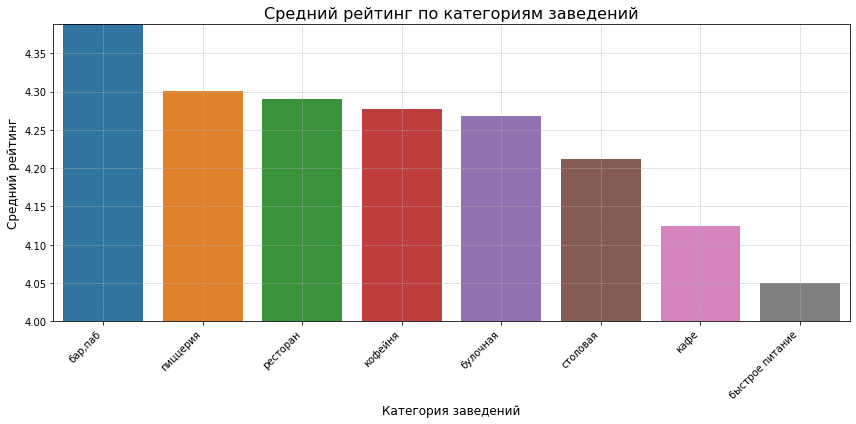

In [29]:
# Группируем данные по категориям и рассчитываем средний рейтинг для каждой категории
category_rating = data.groupby('category')['rating'].mean().reset_index(name='mean_rating')

# Сортируем категории по среднему рейтингу
category_rating = category_rating.sort_values(by='mean_rating', ascending=False)

# Строим столбчатую диаграмму для отображения средних рейтингов по категориям заведений
plt.figure(figsize=(12, 6))
sns.barplot(x='category', y='mean_rating', data=category_rating)

# Ограничиваем ось Y от 4 до максимального значения
plt.ylim(4, category_rating['mean_rating'].max())

# Добавляем заголовок и подписи осей
plt.title('Средний рейтинг по категориям заведений', fontsize=16)
plt.xlabel('Категория заведений', fontsize=12)
plt.ylabel('Средний рейтинг', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()


### Промежуточный вывод:

Анализ средних рейтингов по категориям заведений общественного питания показывает, что усреднённые рейтинги различаются незначительно, находясь в диапазоне от **4.05** до **4.39**. Наивысший средний рейтинг наблюдается у категории **бар, паб** (4.39), что указывает на высокую оценку данного типа заведений посетителями. Наименьший средний рейтинг имеет категория **быстрое питание** (4.05), что может быть связано с особенностями предоставляемого сервиса или предложением данного типа заведений.

Другие категории, такие как **ресторан** (4.29), **пиццерия** (4.30) и **кофейня** (4.28), имеют схожие высокие средние оценки, что свидетельствует о стабильной популярности и хорошем уровне качества среди этих типов заведений.

Таким образом, хотя различия в усреднённых рейтингах незначительны, можно отметить, что заведения категории **быстрое питание** оцениваются несколько ниже, в то время как **бары и пабы** получают наивысшие оценки среди всех категорий.


## 3.8 Визуализация распределения средних рейтингов заведений по районам Москвы


In [30]:
# Вычисляем средний рейтинг по полным названиям районов
rating_df = data.groupby('district')['rating'].mean().reset_index()
rating_df.columns = ['district', 'mean_rating']
rating_df

,district,mean_rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [31]:
# Первый путь
path_1 = '/Users/aleksejpanov/Desktop/проекты по Яндекс Практикум /сборный проект/admin_level_geomap.geojson'

# Альтернативный путь
path_2 = '/datasets/admin_level_geomap.geojson'

# Проверяем, существует ли файл по первому пути
if os.path.exists(path_1):
    geojson_path = path_1
elif os.path.exists(path_2):
    geojson_path = path_2


# Загружаем GeoJSON файл
with open(geojson_path, 'r') as f:
    geo_json = json.load(f)

# Создаем карту Москвы
moscow_map = folium.Map(location=[55.751244, 37.618423], zoom_start=10, tiles='Cartodb Positron')

# Создаем хороплет-карту с рейтингами по полным названиям районов
Choropleth(
    geo_data=geo_json,                                  # Данные с границами районов
    data=rating_df,                                     # Данные с рейтингами
    columns=['district', 'mean_rating'],                # Связь данных с районом и рейтингом
    key_on='feature.properties.name',                   # Полные названия районов
    fill_color='YlGn',                                  # Цветовая палитра
    fill_opacity=0.7,                                   # Прозрачность заливки
    line_opacity=0.2,                                   # Прозрачность линий
    legend_name='Средний рейтинг заведений по районам'   # Название легенды
).add_to(moscow_map)

# Отображаем карту
moscow_map

### Промежуточный вывод:

Центральный административный округ (ЦАО) выделяется как район с наивысшим средним рейтингом заведений. Это может свидетельствовать о высоком уровне обслуживания и качестве заведений в центре города, где сосредоточены наиболее популярные и востребованные места. На окраинах города, особенно в южных и восточных районах, наблюдаются несколько более низкие средние рейтинги заведений, что может свидетельствовать о менее развитой инфраструктуре или менее конкурентной среде для заведений общественного питания.

## 3.9 Визуализация всех заведений на карте с использованием кластеров

In [32]:
# Координаты центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаем карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# Создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(moscow_map)

# Функция для создания маркеров и добавления их в кластер
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],  # Координаты заведения
        popup=f"{row['name']} ({row['rating']})"  # Информация о заведении
    ).add_to(marker_cluster)

# Применяем функцию create_clusters к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# Отображаем карту
moscow_map

### Промежуточный вывод:

На карте с кластеризацией заведений видно, что наибольшая концентрация заведений наблюдается в Центральном округе Москвы (ЦАО), а также в прилегающих районах. Это подтверждает, что центр города является основным местом притяжения для заведений общественного питания. Окраины города, такие как южные и восточные районы, имеют значительно меньшую плотность заведений, что может свидетельствовать о менее развитой ресторанной инфраструктуре или меньшем спросе на заведения общественного питания в этих районах.

## 3.10 Топ-15 улиц Москвы по количеству заведений и категориям

In [33]:
# Группируем данные по улицам, считая количество объектов общепита на каждой улице.
# Затем сортируем результат по количеству объектов в порядке убывания.
total_sum = data.groupby('street')['name'].count().reset_index(name='total_sum').sort_values(by='total_sum', ascending=False)

# Выбираем топ-15 улиц с наибольшим количеством объектов общепита.
top15_total_sum = total_sum.head(15)

# Выводим результат
top15_total_sum


,street,total_sum
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


### Промежуточный вывод:

Среди топ-15 улиц Москвы по количеству заведений лидирует проспект Мира с 184 заведениями. Другие улицы, такие как Профсоюзная улица (122 заведения) и проспект Вернадского (108 заведений), также являются популярными местами с высокой концентрацией объектов общественного питания. Большинство улиц в топ-15 — это крупные проспекты и магистрали, такие как Ленинский проспект, Ленинградский проспект и Дмитровское шоссе, что свидетельствует о том, что заведения общественного питания концентрируются вблизи оживленных транспортных артерий Москвы.


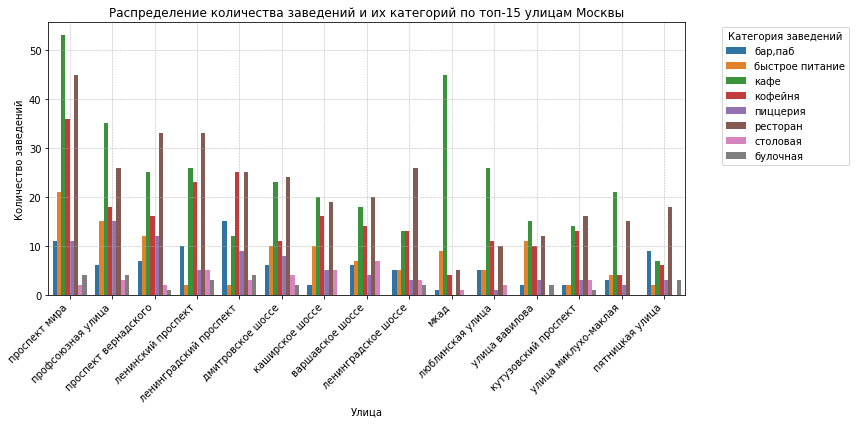

In [34]:
# Группируем данные по улицам и категориям, подсчитываем количество заведений
street_category_count = data.groupby(['street', 'category'])['name'].count().reset_index(name='count')

# Находим топ-15 улиц по количеству заведений
top15_total_sum = (data.groupby('street')['name']
                   .count()
                   .reset_index(name='total_sum')
                   .sort_values(by='total_sum', ascending=False)
                   .head(15))

# Фильтруем данные по этим топ-15 улицам
street_category_count_top15 = street_category_count[street_category_count['street'].isin(top15_total_sum['street'])]

# Сортируем улицы по количеству заведений
top15_sorted = (street_category_count_top15.groupby('street')['count']
                .sum()
                .reset_index()
                .sort_values(by='count', ascending=False))

# Упорядочиваем улицы для графика
order = top15_sorted['street']

# Строим столбчатую диаграмму с упорядоченными улицами
plt.figure(figsize=(12, 6))
sns.barplot(x='street', y='count', hue='category', data=street_category_count_top15, order=order)

# Добавляем заголовок и подписи осей
plt.title('Распределение количества заведений и их категорий по топ-15 улицам Москвы')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')

# Поворачиваем метки оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем легенду
plt.legend(title='Категория заведений', bbox_to_anchor=(1.05, 1), loc='upper left')

# Добавляем сетку для улучшения восприятия
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()


### Промежуточный вывод:

График показывает, что улицы с наибольшим количеством заведений в Москве — это проспект Мира, Профсоюзная улица и проспект Вернадского. Эти улицы расположены в центральных и активно застроенных районах, что объясняет большое разнообразие заведений, таких как кафе, рестораны и кофейни. В отличие от центральных районов, на улицах спальных районов, таких как Люблинская улица и МКАД, преобладают заведения быстрого питания и кофейни. МКАД особенно выделяется большим количеством кофеен, что может быть связано с его транспортной ролью: большое количество людей, отправляющихся в длительные поездки, часто останавливаются за кофе для дальнейшего пути. Таким образом, центральные улицы Москвы предлагают разнообразные варианты для длительных посещений, тогда как транспортные и спальные районы ориентированы на заведения быстрого обслуживания, что отражает потребности местных жителей и путешественников.



## 3.11 Улицы с единичными объектами общественного питания: анализ и характеристики

In [35]:
# Сортируем улицы с наименьшим количеством объектов общепита
total_sum_min = total_sum.sort_values(by='total_sum', ascending=True)

# Фильтруем улицы, на которых находится только одно заведение
total_sum_min_1 = total_sum[total_sum['total_sum'] == 1]

# Фильтруем исходные данные по найденным улицам с одним заведением
street_min_1 = data[data['street'].isin(total_sum_min_1['street'])]

# Выводим результат - данные заведений, расположенных на улицах с одним объектом общепита
street_min_1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,chain_name,district_abbreviation
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,средний счет:300–500 ₽,400.0,NaN,False,180,улица бусиновская горка,False,Несетевые заведения,САО
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,False,<NA>,прибрежный проезд,False,Несетевые заведения,САО
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,<NA>,парк левобережный,False,Сетевые заведения,САО
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,средний счет:500–800 ₽,650.0,NaN,True,<NA>,угличская улица,False,Сетевые заведения,СВАО
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,True,<NA>,ландшафтный заказник лианозовский,False,Сетевые заведения,СВАО
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулева, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,False,90,улица шкулева,False,Несетевые заведения,ЮВАО
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,False,<NA>,улица артюхиной,False,Несетевые заведения,ЮВАО
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,True,<NA>,кузьминская улица,False,Сетевые заведения,ЮВАО
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,True,40,новороссийская улица,False,Сетевые заведения,ЮВАО


In [36]:
# Координаты центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаем карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# Создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(moscow_map)

# Функция для создания маркеров и добавления их в кластер
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],  # Координаты заведения
        popup=f"{row['name']} ({row['rating']})"  # Информация о заведении (название и рейтинг)
    ).add_to(marker_cluster)

# Применяем функцию create_clusters к каждой строке отфильтрованного датафрейма street_min_1
street_min_1.apply(create_clusters, axis=1)

# Отображаем карту
moscow_map


### Промежуточный вывод:

На карте отобразились заведения, которые находятся на улицах с единственным объектом общепита. Она иллюстрирует их распределение по районам Москвы. Такие заведения могут иметь уникальные характеристики или располагаться в районах с низкой конкуренцией среди заведений общественного питания. 

Это может указывать на то, что данные заведения находятся в менее оживленных или спальных районах Москвы, где спрос на объекты общественного питания ниже по сравнению с центральными или деловыми районами.


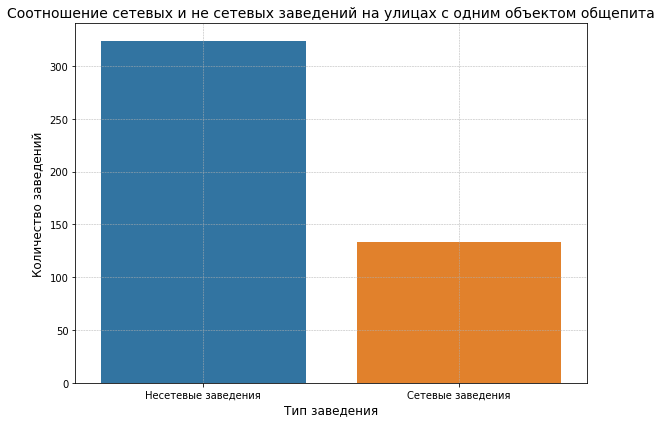

In [37]:
# Подсчитываем количество сетевых и не сетевых заведений
chain_count = street_min_1['chain_name'].value_counts().reset_index()
chain_count.columns = ['Тип заведения', 'Количество заведений']

# Строим столбчатую диаграмму
plt.figure(figsize=(8, 6))
sns.barplot(x='Тип заведения', y='Количество заведений', data=chain_count)

# Добавляем заголовок и подписи осей
plt.title('Соотношение сетевых и не сетевых заведений на улицах с одним объектом общепита', fontsize=14)
plt.xlabel('Тип заведения', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()

### Промежуточный вывод:

На графике видно, что на улицах с одним заведением доминируют несетевые заведения, которых значительно больше по сравнению с сетевыми. Это может указывать на то, что такие улицы менее коммерчески привлекательны для крупных сетей или находятся в менее посещаемых районах, где преимущественно открываются локальные и уникальные точки общественного питания. Сетевые заведения представлены в меньшем количестве, что подтверждает их тенденцию к размещению в более популярных и оживленных местах.

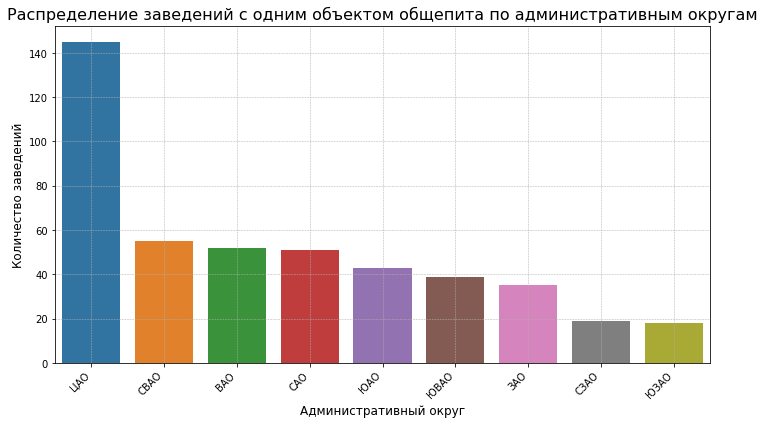

In [38]:
# Группируем данные по районам и считаем количество заведений в каждом районе
district_distribution = street_min_1.groupby('district_abbreviation').size().reset_index(name='count')

# Сортируем данные по количеству заведений
district_distribution = district_distribution.sort_values(by='count', ascending=False)

# Строим столбчатую диаграмму с отсортированными округами
plt.figure(figsize=(10, 6))
sns.barplot(x='district_abbreviation', y='count', data=district_distribution, order=district_distribution['district_abbreviation'])

# Добавляем заголовок и подписи осей
plt.title('Распределение заведений с одним объектом общепита по административным округам', fontsize=16)
plt.xlabel('Административный округ', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()


### Промежуточный вывод:

Этот график показывает распределение заведений с одним объектом общепита по административным округам Москвы. На графике видно, что: В Центральном административном округе (ЦАО) значительно больше заведений, чем в других округах. Это может объясняться высокой концентрацией коммерческой деятельности и большого количества уникальных точек общепита в центре Москвы.
В округах ЮАО, ЮВАО, и ВАО также наблюдается заметное количество уникальных заведений, но их меньше по сравнению с ЦАО.
Округа, такие как ЗАО, СЗАО и ЮЗАО, имеют наименьшее количество заведений с одним объектом общепита.

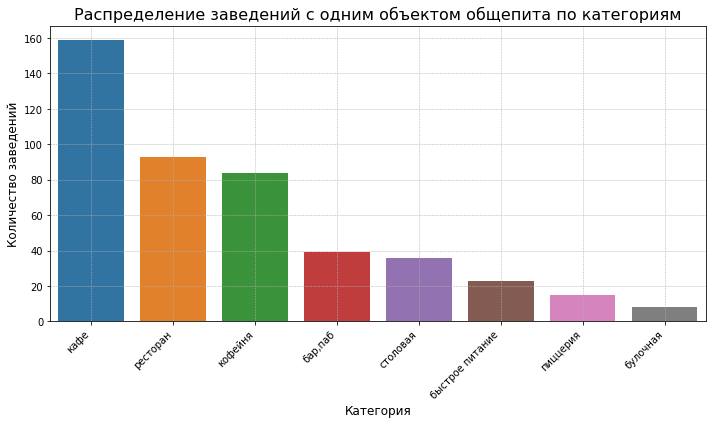

In [39]:
# Группируем данные по категориям и считаем количество заведений в каждой категории
category_distribution = street_min_1.groupby('category').size().reset_index(name='count')

# Сортируем категории по количеству заведений в убывающем порядке
category_distribution = category_distribution.sort_values(by='count', ascending=False)

# Строим столбчатую диаграмму
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='count', data=category_distribution)

# Добавляем заголовок и подписи осей
plt.title('Распределение заведений с одним объектом общепита по категориям', fontsize=16)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()

### Промежуточный вывод:

На данном графике мы видим распределение заведений с одним объектом общепита по различным категориям.
Кафе является самой распространенной категорией заведений, имеющей наибольшее количество объектов, представленных по одному на каждой улице.
Рестораны и бары/пабы также занимают значительное количество среди этих заведений.
Меньше всего представлены булочные, пиццерии и быстрое питание.
Это может свидетельствовать о том, что небольшие локальные заведения чаще представляют собой кафе или рестораны, в то время как другие категории, такие как пиццерии и булочные, встречаются реже.

### Общий вывод по пункту 3.11 Улицы с единичными объектами общественного питания: анализ и характеристики¶
Анализ улиц с единственным объектом общепита в Москве выявил несколько ключевых закономерностей. Во-первых, такие заведения часто располагаются в менее оживленных или спальных районах, где конкуренция среди заведений общественного питания ниже. Это отражено на карте, показывающей их распределение по административным округам Москвы.

Большинство заведений, находящихся на улицах с одним объектом, — это несетевые заведения, что говорит о том, что крупные сети предпочитают более коммерчески привлекательные и оживленные районы с большим потоком посетителей. Локальные заведения же открываются в менее востребованных местах, где они могут играть важную роль в удовлетворении потребностей местных жителей.

При этом Центральный административный округ (ЦАО) выделяется на фоне других округов по количеству таких заведений. Это можно объяснить высокой плотностью коммерческих объектов и уникальностью общепита в центре Москвы. Округа ЮАО, ВАО и ЮВАО также имеют значительное количество заведений, тогда как в ЗАО, СЗАО и ЮЗАО их меньше, что свидетельствует о различиях в потребительских привычках и активности в этих районах.

По категориям на улицах с единичными объектами общепита доминируют кафе, за которыми следуют рестораны и бары/пабы. Меньше всего представлены такие категории, как булочные, пиццерии и быстрое питание. Это указывает на то, что в локальных заведениях преобладают заведения с более широким ассортиментом блюд, тогда как узкоспециализированные заведения встречаются реже.

Таким образом, улицы с одним объектом общественного питания в основном характеризуются меньшей коммерческой активностью, преобладанием локальных заведений, а также относительно широкой представленностью кафе и ресторанов.

## 3.12 Влияние удалённости от центра на средние чеки в районах Москвы

In [40]:
# Группируем данные по столбцу 'district' и вычисляем медиану столбца 'middle_avg_bill' для каждого района
district_median = data.groupby('district')['middle_avg_bill'].median().reset_index(name='median')

# Выводим результат с медианными значениями среднего чека по каждому району
district_median


,district,median
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [41]:
# Первый путь
path_1 = '/Users/aleksejpanov/Desktop/проекты по Яндекс Практикум /сборный проект/admin_level_geomap.geojson'

# Альтернативный путь
path_2 = '/datasets/admin_level_geomap.geojson'

# Проверяем, существует ли файл по первому пути
if os.path.exists(path_1):
    geojson_path = path_1
elif os.path.exists(path_2):
    geojson_path = path_2

# Загружаем GeoJSON файл
with open(geojson_path, 'r') as f:
    geo_json = json.load(f)

# Группируем данные по столбцу 'district' и вычисляем медиану столбца 'middle_avg_bill' для каждого района
district_median = data.groupby('district')['middle_avg_bill'].median().reset_index(name='median')

# Создаем карту Москвы
moscow_map = folium.Map(location=[55.751244, 37.618423], zoom_start=10, tiles='Cartodb Positron')

# Создаем хороплет-карту с медианными значениями среднего чека по районам
Choropleth(
    geo_data=geo_json,                                  # Данные с границами районов
    data=district_median,                               # Данные с медианными значениями
    columns=['district', 'median'],                     # Связь данных с районом и медианной стоимостью
    key_on='feature.properties.name',                   # Полные названия районов
    fill_color='YlGnBu',                                # Цветовая палитра
    fill_opacity=0.7,                                   # Прозрачность заливки
    line_opacity=0.2,                                   # Прозрачность линий
    legend_name='Медианная стоимость чека по районам (руб.)'   # Название легенды
).add_to(moscow_map)

# Отображаем карту
moscow_map

### Промежуточный вывод:

На основе полученных данных можно сделать вывод, что средние чеки в заведениях Центрального административного округа (ЦАО) и Западного административного округа (ЗАО) значительно выше по сравнению с другими районами Москвы. Это объясняется высокой концентрацией коммерческой активности в центре города, где спрос на заведения общественного питания высокий, и множество заведений ориентированы на платежеспособную аудиторию. Западный административный округ (ЗАО) также выделяется высокими ценами, что, возможно, связано с наличием федеральной трассы Москва-Санкт-Петербург. Эта магистраль привлекает большой поток транзитных пассажиров и туристов, что создает спрос на более дорогие заведения. Дополнительная коммерческая активность, связанная с транспортными узлами, может способствовать развитию инфраструктуры, включая рестораны с высокими средними чеками. В то время как в других округах, таких как Восточный, Южный и Юго-Восточный административные округа, средний чек ниже. Это может быть связано с удаленностью от центра города и меньшим спросом на дорогие заведения в этих районах, где находятся преимущественно жилые или менее коммерчески активные зоны.

## Общий вывод по исследованию заведений общественного питания в Москве:

На основании проведённого исследования рынка общественного питания в Москве можно сделать несколько ключевых выводов, которые помогут инвесторам из фонда «Shut Up and Take My Money» принять обоснованное решение по открытию нового заведения.

1. **Категории заведений**. Большую долю рынка занимают **кафе (2378 заведений)** и **рестораны (2043 заведения)**, что указывает на высокий спрос на такие форматы заведений. Кофейни и бары также популярны, но уступают кафе и ресторанам по количеству. Менее распространены булочные и пиццерии, что может свидетельствовать о более нишевом спросе.

2. **Количество посадочных мест**. **Бары и рестораны** имеют наибольшее среднее количество посадочных мест, что делает их привлекательными для вечерних или групповых посещений. **Булочные и пиццерии** предлагают меньшее количество мест, что отражает их узкую специализацию и формат быстрого обслуживания.

3. **Сетевые и несетевые заведения**. Преобладают **несетевые заведения**, что подчёркивает интерес москвичей к уникальным концепциям. Однако **булочные, пиццерии и кофейни** часто представлены в сетевом формате, что делает их привлекательным выбором для инвесторов, заинтересованных в стандартизированных форматах.

4. **Популярные сети**. **Кофейни** и **пиццерии** лидируют среди сетевых заведений, что показывает их востребованность на рынке и может быть хорошей отправной точкой для развития сетевого бизнеса.

5. **Административные округа и размещение заведений**. **Центральный административный округ (ЦАО)** лидирует как по количеству заведений, так и по их разнообразию. Этот район остаётся привлекательным для открытия заведений общественного питания, но из-за высокой конкуренции и арендных ставок инвесторам стоит учитывать потенциальные риски. **Северный, Южный и Западный округа** также показывают высокую активность и могут быть отличной альтернативой для новых инвестиций.

6. **Рейтинги заведений**. Заведения в Москве стабильно получают высокие оценки, особенно в категории **баров и ресторанов**, что указывает на высокий уровень обслуживания и удовлетворённость клиентов.

7. **Улицы с единичными объектами общепита**. В менее активных районах, где на улицах находится только одно заведение, часто расположены **несетевые объекты**, что может быть возможностью для инвесторов предложить уникальный формат с низкой конкуренцией.

8. **Средние чеки**. **ЦАО и ЗАО** характеризуются самыми высокими средними чеками, что связано с высокой арендной стоимостью и коммерческой активностью. Эти районы подходят для открытия заведений с высоким средним чеком. В удалённых районах Москвы средние чеки ниже, что создаёт возможности для открытия более бюджетных форматов заведений.

Таким образом, при выборе места для нового заведения инвесторам стоит обратить внимание на популярные форматы, такие как **кафе и рестораны**, и рассматривать районы с активной коммерческой деятельностью, такие как **ЦАО** и **ЗАО**, а также учитывать соотношение **средних чеков** и **количества посадочных мест** для расчёта рентабельности будущего заведения.


# Шаг 4. Детализируем исследование: открытие кофейни

Основатели фонда «Shut Up and Take My Money» хотят открыть новую кофейню в Москве, вдохновленную легендарной "Central Perk" из сериала «Друзья». Их цель — создать доступное и привлекательное заведение, которое станет местом притяжения для самых разных категорий населения.

Однако, прежде чем приступать к реализации этой амбициозной идеи, необходимо провести детальный анализ рынка. Важно понять, как кофейни распределены по районам города, какие заведения имеют наибольшую популярность, каковы предпочтения москвичей по цене чашки капучино и как варьируются рейтинги заведений. Кроме того, ключевым аспектом является исследование круглосуточных кофеен, ведь работа в формате 24/7 может стать дополнительным преимуществом.

В этом исследовании будет рассмотрено текущее состояние кофейного бизнеса в Москве, что позволит сделать обоснованные выводы и предложить рекомендации для открытия новой кофейни.


### 4.1 Количество кофеен и их распределение по районам Москвы


In [42]:
# Фильтруем данные для категории 'кофейня'
coffee_shops_total = data[data['category'] == 'кофейня']

# Выводим общее количество кофеен в датасете через print
print("Количество кофеен в датасете:", len(coffee_shops_total))

Количество кофеен в датасете: 1413


In [43]:
# Группируем данные по административным округам ('district_abbreviation') и подсчитываем количество кофеен ('category')
coffee_district = (coffee_shops_total.groupby('district_abbreviation')['category']
                   .count()  # Считаем количество кофеен в каждом округе
                   .reset_index(name='total_sum')  # Сбрасываем индекс и переименовываем колонку с подсчетом
                   .sort_values(by='total_sum', ascending=False))  # Сортируем результат по убыванию количества кофеен
coffee_district

,district_abbreviation,total_sum
5,ЦАО,428
2,САО,193
3,СВАО,159
1,ЗАО,150
6,ЮАО,131
0,ВАО,105
8,ЮЗАО,96
7,ЮВАО,89
4,СЗАО,62


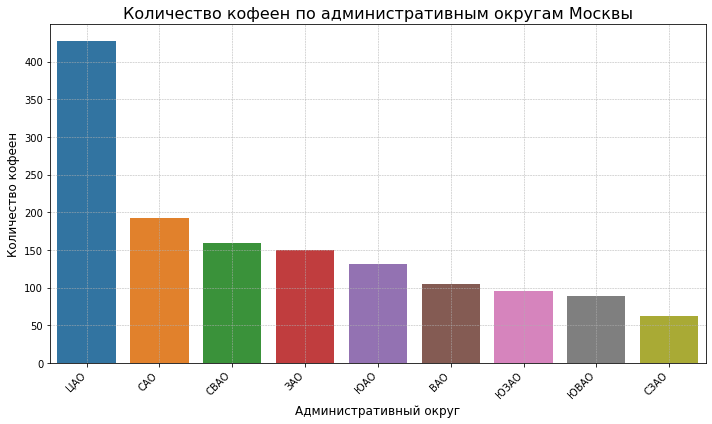

In [44]:
# Строим столбчатую диаграмму для количества кофеен по административным округам
plt.figure(figsize=(10, 6))
sns.barplot(x='district_abbreviation', y='total_sum', data=coffee_district)

# Добавляем заголовок и подписи осей
plt.title('Количество кофеен по административным округам Москвы', fontsize=16)
plt.xlabel('Административный округ', fontsize=12)
plt.ylabel('Количество кофеен', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()


### Промежуточный вывод:

На карте показано распределение кофеен по административным округам Москвы. Как видно, наиболее высокая концентрация кофеен наблюдается в Центральном административном округе (ЦАО), что объясняется плотной коммерческой и туристической активностью в центре города. Этот район традиционно привлекает наибольшие потоки людей, что делает его идеальным местом для открытия кофеен.

Другие районы с высокой плотностью кофеен включают Северный административный округ (САО), Южный административный округ (ЮАО), и Западный административный округ (ЗАО). Эти округа также характеризуются хорошей инфраструктурой, жилыми и деловыми кварталами, что способствует развитию заведений общественного питания, включая кофейни.

На юго-востоке и юго-западе Москвы, а также в некоторых северных районах, плотность кофеен значительно ниже, что может быть связано с меньшим количеством коммерческих и жилых объектов, а также с более низким спросом на заведения общественного питания в этих зонах.

Таким образом, кофейни наиболее активно развиваются в центре и вокруг деловых районов, что делает ЦАО и его прилегающие округа наиболее привлекательными для дальнейшего открытия новых заведений.


## 4.2 Наличие круглосуточных кофеен

In [45]:
# Вычисляем долю круглосуточных кофеен
percentage_24_7 = len(coffee_shops_total[coffee_shops_total['is_24_7'] == True]) / len(coffee_shops_total) * 100

# Выводим результат в процентах
print(f"Доля круглосуточных кофеен: {percentage_24_7:.2f}%")

Доля круглосуточных кофеен: 4.18%


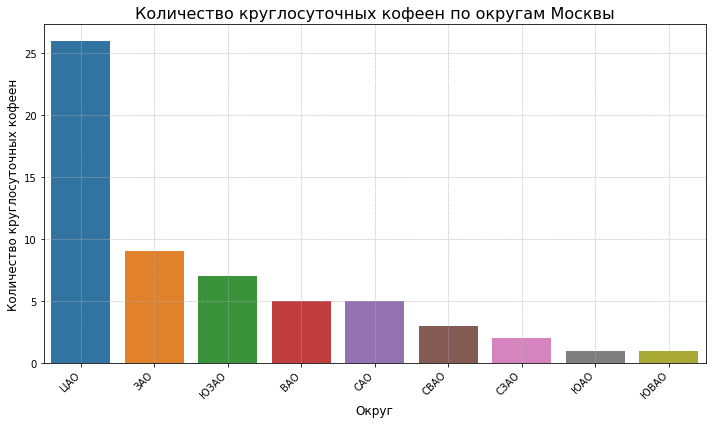

In [46]:
# Группируем данные по округам и считаем количество круглосуточных кофеен в каждом округе
district_24_7 = coffee_shops_total[coffee_shops_total['is_24_7'] == True].groupby('district_abbreviation').size().reset_index(name='count_24_7')

# Сортируем по убыванию количества круглосуточных кофеен
district_24_7 = district_24_7.sort_values(by='count_24_7', ascending=False)

# Строим столбчатую диаграмму
plt.figure(figsize=(10, 6))
sns.barplot(x='district_abbreviation', y='count_24_7', data=district_24_7)

# Добавляем заголовок и подписи осей
plt.title('Количество круглосуточных кофеен по округам Москвы', fontsize=16)
plt.xlabel('Округ', fontsize=12)
plt.ylabel('Количество круглосуточных кофеен', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()


### Промежуточный вывод:

В Москве работает 59 круглосуточных кофеен, что составляет примерно 4,2% от общего числа заведений этой категории. Наибольшее количество таких кофеен сосредоточено в Центральном административном округе (ЦАО), где работает 26 круглосуточных заведений. Это логично, поскольку ЦАО является деловым и культурным центром Москвы с высокой концентрацией людей в любое время суток.

Западный административный округ (ЗАО) занимает второе место с 9 заведениями, за ним следуют Юго-Западный административный округ (ЮЗАО) с 7 заведениями и Северный административный округ (САО) с 5 заведениями. Остальные округа имеют менее 5 круглосуточных кофеен, что может свидетельствовать о меньшем спросе на такие заведения в этих районах.


## 4.3 Рейтинги кофеен: анализ и распределение по районам

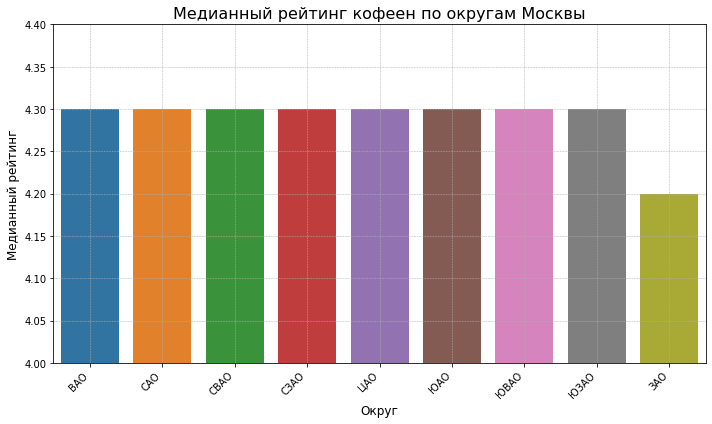

In [47]:
# Группируем данные по округам и вычисляем медианный рейтинг кофеен для каждого округа
district_median_rating = coffee_shops_total.groupby('district_abbreviation')['rating'].median().reset_index(name='median_rating')

# Сортируем по убыванию
district_median_rating = district_median_rating.sort_values(by='median_rating', ascending=False)

# Строим столбчатую диаграмму
plt.figure(figsize=(10, 6))
sns.barplot(x='district_abbreviation', y='median_rating', data=district_median_rating)

# Ограничиваем ось Y от значения 4
plt.ylim(4, district_median_rating['median_rating'].max() + 0.1)

# Добавляем заголовок и подписи осей
plt.title('Медианный рейтинг кофеен по округам Москвы', fontsize=16)
plt.xlabel('Округ', fontsize=12)
plt.ylabel('Медианный рейтинг', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()

### Промежуточный вывод:

Анализ медианных рейтингов кофеен по районам Москвы показывает, что в большинстве районов рейтинг кофеен стабильно держится на уровне 4.3. Исключением является Западный административный округ (ЗАО), где медианный рейтинг составляет 4.2. Это свидетельствует о том, что общий уровень обслуживания в кофейнях, по оценкам посетителей, довольно высок и равномерен по всем районам, что может говорить о стандартизации качества среди заведений этой категории. ЗАО, возможно, имеет незначительно более низкий рейтинг, что может быть связано с особенностями местных заведений.

## 4.4 Ориентировочная стоимость чашки капучино при открытии кофейни

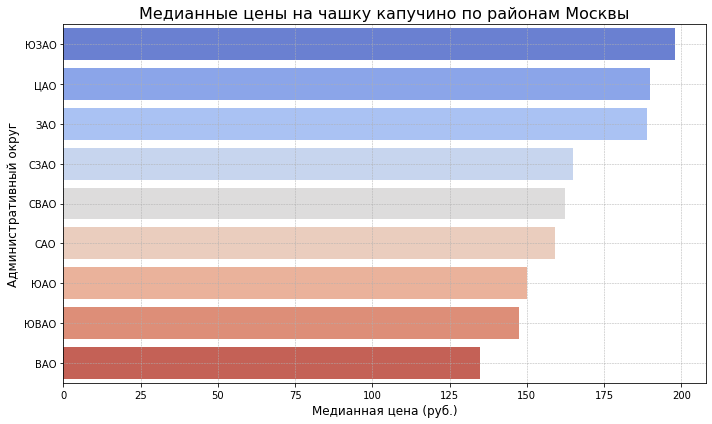

In [48]:
# Проверяем, что медианные значения стоимости чашки капучино по районам вычисляются корректно
coffee_cup_median = (coffee_shops_total.groupby('district_abbreviation')['middle_coffee_cup']
                     .median()
                     .reset_index(name='middle_coffee_cup')
                     .sort_values(by='middle_coffee_cup', ascending=False))

# Строим горизонтальную столбчатую диаграмму для отображения медианных цен на чашку капучино по районам
plt.figure(figsize=(10, 6))
sns.barplot(x='middle_coffee_cup', y='district_abbreviation', data=coffee_cup_median, palette='coolwarm')

# Добавляем заголовок и подписи осей
plt.title('Медианные цены на чашку капучино по районам Москвы', fontsize=16)
plt.xlabel('Медианная цена (руб.)', fontsize=12)
plt.ylabel('Административный округ', fontsize=12)

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()



### Промежуточный вывод:

Анализ медианных цен на чашку капучино по районам Москвы показывает, что самые высокие цены на кофе наблюдаются в Юго-Западном административном округе (198 рублей), Центральном административном округе (190 рублей) и Западном административном округе (189 рублей). Эти районы известны высокой стоимостью аренды помещений и уровнем жизни, что влияет на уровень цен в заведениях общественного питания.

Кроме того, Западный административный округ может демонстрировать более высокие цены из-за проходящей через него федеральной магистрали Москва-Санкт-Петербург, что увеличивает поток транзитных пассажиров и повышает спрос на кофе. В то время как в других районах, таких как Восточный административный округ (135 рублей) и Юго-Восточный административный округ (147.5 рублей), цены значительно ниже, что связано с их удалённостью от центра и менее активной коммерческой деятельностью.

Таким образом, при открытии новой кофейни стоит ориентироваться на цену чашки капучино в диапазоне 190–198 рублей в более престижных районах (ЦАО, ЗАО, ЮЗАО) и 135–150 рублей в удалённых от центра районах, где ожидается меньший спрос на дорогостоящие предложения.


## 4.5 Медианное количество посадочных мест в кофейнях по районам Москвы

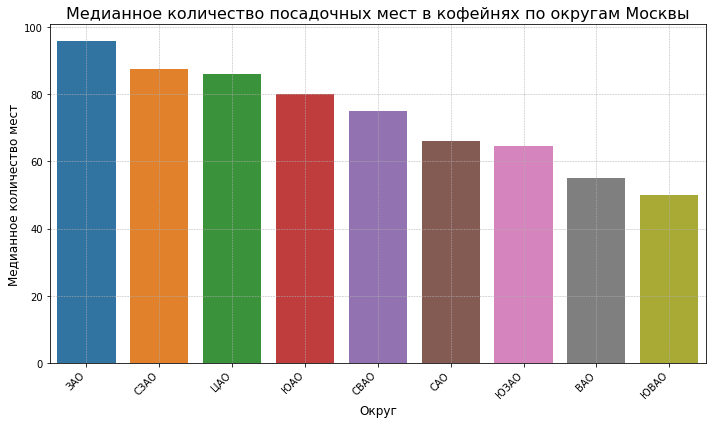

In [49]:
# Группируем кофейни по округам и вычисляем медианное количество посадочных мест для каждого округа
district_median_seats = coffee_shops_total.groupby('district_abbreviation')['seats'].median().reset_index(name='median_seats')

# Сортируем по убыванию
district_median_seats = district_median_seats.sort_values(by='median_seats', ascending=False)

# Строим столбчатую диаграмму
plt.figure(figsize=(10, 6))
sns.barplot(x='district_abbreviation', y='median_seats', data=district_median_seats)

# Добавляем заголовок и подписи осей
plt.title('Медианное количество посадочных мест в кофейнях по округам Москвы', fontsize=16)
plt.xlabel('Округ', fontsize=12)
plt.ylabel('Медианное количество мест', fontsize=12)

# Поворачиваем метки на оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right')

# Добавляем сетку
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Отображаем график
plt.tight_layout()
plt.show()


## Промежуточный вывод:

Анализ медианного количества посадочных мест в кофейнях по районам Москвы показывает, что в среднем кофейни, расположенные в Западном административном округе, имеют наибольшее количество посадочных мест — 96 мест. Это может быть связано с тем, что этот район обладает более просторными помещениями или кофейни ориентированы на большую проходимость. Центральный административный округ, несмотря на высокую плотность заведений, имеет медианное значение посадочных мест в размере 86, что говорит о наличии как небольших, так и крупных заведений. Восточный и Юго-Восточный округа демонстрируют самые низкие медианные значения — 55 и 50 соответственно, что может свидетельствовать о меньшем масштабе заведений в этих районах.

## Рекомендация для открытия новой кофейни:

Анализ данных о кофейнях в Москве показывает, что наибольшая концентрация заведений находится в Центральном административном округе (ЦАО), который остаётся ключевым местом для кафе и ресторанов. Этот район, благодаря высокой плотности коммерческих и туристических объектов, привлекает значительные потоки людей, что делает его привлекательным для открытия новых заведений. Однако высокая конкуренция и стоимость аренды могут потребовать более высоких инвестиций для открытия кофейни в ЦАО. 

Другие районы, такие как Западный административный округ (ЗАО) и Юго-Западный административный округ (ЮЗАО), также демонстрируют хорошую плотность кофеен и высокие цены на чашку капучино (189-198 рублей). Эти районы могут быть интересными для открытия кофейни, особенно учитывая их развитую инфраструктуру, приток транзитных пассажиров через федеральные магистрали, а также высокий уровень доходов местных жителей. 

Меньшая плотность кофеен наблюдается в Восточном и Юго-Восточном административных округах, что может свидетельствовать о наличии свободных ниш для открытия новых заведений. Однако в этих районах необходимо учитывать более низкий средний чек на капучино (135-147 рублей) и меньшую вместимость заведений, что может ограничить потенциальную выручку.

Исходя из полученных данных, можно сделать следующие рекомендации:
- **ЦАО и ЗАО** подходят для открытия более дорогих и престижных кофеен с расчётом на капучино по цене 190-198 рублей. Эти районы требуют более высоких инвестиций, но обещают высокую посещаемость и потенциальную прибыльность.
- **Юго-Западный округ** также является привлекательным местом с хорошей инфраструктурой и высоким спросом, особенно учитывая высокую стоимость чашки капучино.
- **Восточный и Юго-Восточный округа** представляют интерес как районы с меньшей конкуренцией, но с более низкими ценами и доходностью. Для этих районов стоит рассмотреть стратегию открытия заведений с акцентом на доступность и небольшие помещения.

Таким образом, для успешного открытия новой кофейни рекомендуется ориентироваться на престижные районы с высоким средним чеком и плотностью людей, учитывая возможные затраты на аренду и уровень конкуренции.


Презентация: https://disk.yandex.ru/i/rJwdMpc3hCcMLQ